# Coursework 2: Generative Models

## Instructions

### Submission
Please submit one zip file on cate - *CW2.zip* containing the following:
1. A version of this notebook containing your answers. Write your answers in the cells below each question. **Please deliver the notebook including the outputs of the cells**
2. Your trained VAE model as *VAE_model.pth*
3. Your trained Generator and Discriminator: *DCGAN_model_D.pth and DCGAN_model_G.pth*


### Training
Training the GAN will take quite a long time (multiple hours), and so you have four options:
1. Use PaperSpace [as suggested for CW1](https://hackmd.io/@afspies/S1stL8Qnt)
2. Use Lab GPUs via SSH.  The VSCode Remote Develop extension is recommended for this. For general Imperial remote working instructions see [this post](https://www.doc.ic.ac.uk/~nuric/teaching/remote-working-for-imperial-computing-students.html). You'll also want to [setup your environment as outlined here](https://hackmd.io/@afspies/Bkd7Zq60K).
3. Use Colab and add checkpointing to the model training code; this is to handle the case where colab stops a free-GPU kernel after a certain number of hours (~4).
4. Use Colab Pro - If you do not wish to use PaperSpace then you can pay for Colab Pro. We cannot pay for this on your behalf (this is Google's fault).


### Testing
TAs will run a testing cell (at the end of this notebook), so you are required to copy your data ```transform``` and ```denorm``` functions to a cell near the bottom of the document (it is demarkated). You are advised to check that your implementations pass these tests (in particular, the jit saving and loading may not work for certain niche functions)

### General
You can feel free to add architectural alterations / custom functions outside of pre-defined code blocks, but if you manipulate the model's inputs in some way, please include the same code in the TA test cell, so our tests will run easily.

<font color="orange">**The deadline for submission is 19:00, Friday 25th February, 2022** </font>

## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [195]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [196]:
WORKING_ENV = 'COLAB' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'afs219' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/dl_cw_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table
Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [197]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [199]:
# Necessary Hyperparameters 
num_epochs = 10
learning_rate = 0.0001 
batch_size = 64
latent_dim = 16

# Additional Hyperparameters 
kernel_size = 4
init_filters = 8

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [200]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [201]:
# *CODE FOR PART 1.1a IN THIS CELL*
class ConvVAE(nn.Module):
    def __init__(self, latent_dim, in_channels=1, nf=64):
        super().__init__()
        self.latent_dim = latent_dim
        self.nf = nf

        ## encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels=1, out_channels=self.nf, kernel_size=4, stride=2, padding=1), # out: c x 14 x 14
            nn.BatchNorm2d(self.nf),
            nn.ReLU(),
            nn.Conv2d(in_channels=self.nf, out_channels=self.nf*2, kernel_size=4, stride=2, padding=1), # out: c x 7 x 7
            nn.BatchNorm2d(self.nf*2),
            nn.ReLU(),
        )

        # linear layers for learning representations
        self.fc_mu = nn.Linear(in_features=self.nf*2*7*7, out_features=latent_dim)
        self.fc_log_var = nn.Linear(in_features=self.nf*2*7*7, out_features=latent_dim)
        self.fc_d = nn.Linear(in_features=latent_dim, out_features=self.nf*2*7*7)

        ## decoder        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels=self.nf*2, out_channels=self.nf, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels=self.nf, out_channels=1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid(),
        )


    def encode(self, x):
        """
        encode to latent space
        """
        out = self.encoder(x)
        out = out.view(x.size(0), -1)
        mu = self.fc_mu(out)
        log_var = self.fc_log_var(out)
        return mu, log_var

    
    def reparametrize(self, mu, logvar):
        """
        :param mu: mean from the encoder's latent space
        :param log_var: log variance from the encoder's latent space
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps * std + mu


    def decode(self, z):
        """
        decode from latent space
        """
        out = self.fc_d(z)
        out = out.view(z.size(0), self.nf*2, 7, 7)
        out = self.decoder(out)
        return out 


    def forward(self, x):
        mu, log_var = self.encode(x)
        z = self.reparametrize(mu, log_var)
        z = self.decode(z)
        return  z, mu, log_var

# SET UP MODEL
model = ConvVAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)

# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [202]:
# *CODE FOR PART 1.1b IN THIS CELL*
def loss_function_VAE(recon_x, x, mu, logvar):

    b_size = x.size(0)
    criterion = nn.BCELoss(reduction='sum')
    RL = criterion(recon_x, x)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

    return RL, KLD

def fit(model, data_loader, dataset, beta, epoch, num_epochs):

    model.train()
    running_loss = 0.0

    with tqdm.tqdm(data_loader, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):   
            
            data = data
            data = data.to(device)
            # data = data.view(data.size(0), -1) # Use for linear VAE

            recon_x, mu, logvar = model(data)

            RL, KLD = loss_function_VAE(recon_x, data, mu, logvar)

            loss = RL + beta * KLD
            running_loss += np.array([loss.item(), RL.item(), KLD.item()])

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/data.size(0))

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                content_path/'CW_VAE/VAE_model.pth')
            
    train_loss = running_loss / len(data_loader.dataset) 

    return train_loss


def validate(model, data_loader, beta):

    model.eval()
    running_loss = 0.0

    for batch_idx, (data, _) in enumerate(data_loader):  

        data = data
        data = data.to(device)
        # data = data.view(data.size(0), -1) # Use for linear VAE

        recon_x, mu, logvar = model(data)

        RL, KLD = loss_function_VAE(recon_x, data, mu, logvar)
        loss = RL + beta * KLD

        running_loss += np.array([loss.item(), RL.item(), KLD.item()])

    val_loss = running_loss / len(data_loader.dataset)  

    return val_loss

def train(model, beta):
    train_loss = None
    test_loss = None

    for epoch in range(num_epochs):  
        train_epoch_loss = fit(model, loader_train, train_dat, beta, epoch, num_epochs)
        test_epoch_loss = validate(model, loader_test, beta)
        if train_loss is None:
            train_loss = train_epoch_loss
            test_loss = test_epoch_loss
        else:
            train_loss = np.vstack((train_loss, train_epoch_loss))
            test_loss = np.vstack((test_loss, test_epoch_loss))
    
    return train_loss, test_loss

# TRAIN MODEL
beta = 0.5
train_loss, test_loss = train(model, beta)

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [203]:
def kl_divergence(self, z, mu, std):

    # Monte carlo KL divergence (NOT ACTUALLY IMPLEMENTED - FOR DEMONSTRATION PURPOSES ONLY)

    # 1. define the first two probabilities
    p = torch.distributions.Normal(torch.zeros_like(mu), torch.ones_like(std))
    q = torch.distributions.Normal(mu, std)

    # 2. get the probabilities from the equation
    log_qzx = q.log_prob(z)
    log_pz = p.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    
    # sum over last dim to go from single dim distribution to multi-dim
    kl = kl.sum(-1)
    return kl

**ANSWER**

The loss function is composed of two losses:

1. KL Divergence - I have made the assumption that both of my p and q distributions are normal. Hence the term for my KL loss gives the sum of the log probability of the difference between the two distributions, posterior q(z|x) and prior q(z). A more explicit implementation is shown above, this code has the benefit  of being able to tweak the distribution provided if you wanted to make an alternative assumption on the prior. For example a bernoulli distribution could be used (and many implementations in literature do use it, varying mu). Reducing this component reduces how much the posterior dsitribution in the latent space diverges from the assumed Gaussian prior.

2. Reconstruction Error - this is based on the log likelihood of the distribution (likelihood) p(x|z). In deep generative modelling context, this is often modelled as gaussian, paramaterised with by weights theta that are optimised in the neural network. Reducing this component of the loss reduces the reconstruction error, which for continuous data should be modelled as a mean squared error between the real and reconstructed images after passing through the decoder. 

The value for beta balances how much 'importance' you place on either of the loss terms. Beta needs to be carefully chosen between 0 and 1 to achieve the trade off between good reconstruction and good generation. If beta is set at zero it is a stochastic auto-encoder. If beta is set > 1, the model can serve a different purpose. With a factorized prior p(z) and beta > 1 the VAE can be trained to get a disentangled representation. This would mean controlled generation could be achieved by varying different dimensions of the z variable. 


<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

In [204]:
# *CODE FOR PART 1.2a IN THIS CELL*
total_train = None
RL_train = None
KLD_train = None

total_test = None
RL_test = None
KLD_test = None

betas = [0.1, 0.5, 1.0, 1.5, 5.0]

for beta in betas:
    model = ConvVAE(latent_dim).to(device)
    print(f"\nbeta = {beta}")
    # optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    train_loss, test_loss = train(model, beta)

    if total_train is None:
        total_train = train_loss[:, 0]
        RL_train = train_loss[:, 1]
        KLD_train = train_loss[:, 2]

        total_test = test_loss[:, 0]
        RL_test = test_loss[:, 1]
        KLD_test = test_loss[:, 2]

    else:
        total_train = np.vstack((total_train, train_loss[:, 0]))
        RL_train = np.vstack((RL_train, train_loss[:, 1]))
        KLD_train = np.vstack((KLD_train, train_loss[:, 2]))

        total_test = np.vstack((total_test, test_loss[:, 0]))
        RL_test = np.vstack((RL_test, test_loss[:, 1]))
        KLD_test = np.vstack((KLD_test, test_loss[:, 2]))

    model_scripted = torch.jit.script(model)
    path = 'CW_VAE/VAE_model_beta_'+str(beta)+'.pt'
    model_scripted.save(content_path/path)


beta = 0.1


Epoch 9: 100%|██████████| 938/938 [00:10<00:00, 85.86batch/s, loss=75.4]



beta = 0.5


Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 85.01batch/s, loss=94.5]



beta = 1.0


Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 85.03batch/s, loss=107]



beta = 1.5


Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 84.69batch/s, loss=118]



beta = 5.0


Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 84.57batch/s, loss=148]


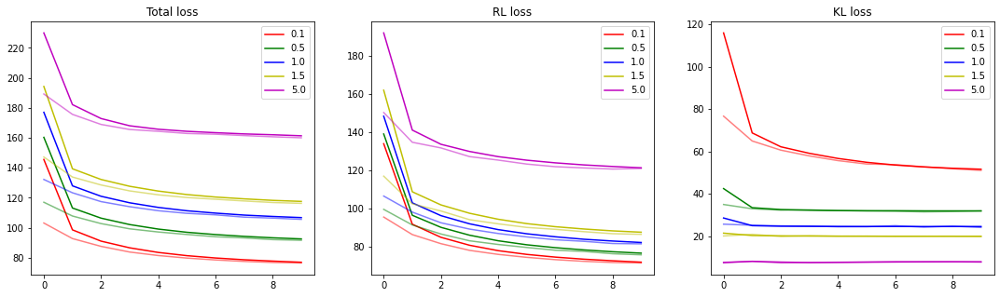

In [205]:
figure, axis = plt.subplots(1, 3)
figure.set_size_inches(18.5, 5, forward=True)

X = np.arange(len(train_loss[:,0]))

titles = ["Total loss", "RL loss", "KL loss"]
colours = ["r", "g", "b", "y", "m", "c"]

for i in range(3):

    for b in range(len(betas)):

        if i == 0:
            y_train = total_train[b, :]
            y_test = total_test[b, :]
        
        elif i == 1:
            y_train = RL_train[b, :]
            y_test = RL_test[b, :]

        else:
            y_train = KLD_train[b, :]
            y_test = KLD_test[b, :]

        axis[i].plot(X, y_train, color=colours[b], label=betas[b])
        axis[i].plot(X, y_test, color=colours[b], alpha=0.5)
    
    axis[i].title.set_text(titles[i])
    axis[i].legend()

plt.show()


## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


In [ ]:
# SET UP MODE AND TRAIN
model = ConvVAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

beta = 0.5
train_loss, test_loss = train(model, beta)

Epoch 9: 100%|██████████| 938/938 [00:11<00:00, 81.68batch/s, loss=92.9]


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
torch.Size([32, 1, 28, 28])
Generated Images
--------------------------------------------------
sample inp torch.Size([32, 16])


/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


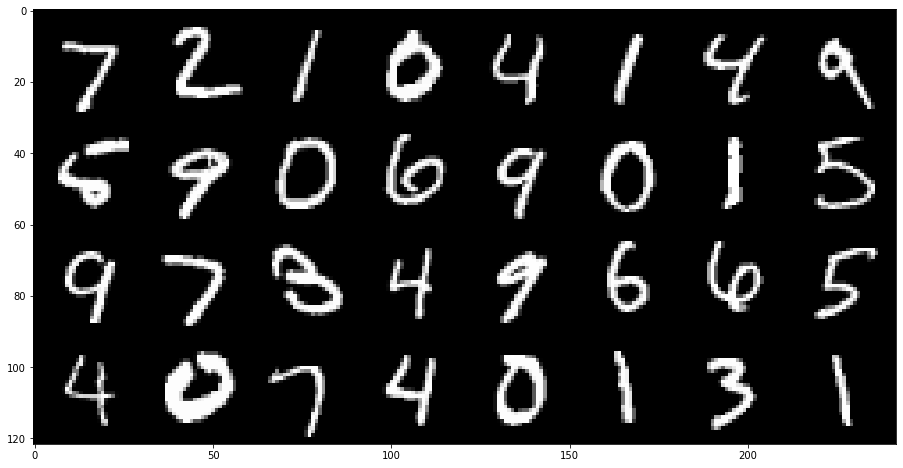

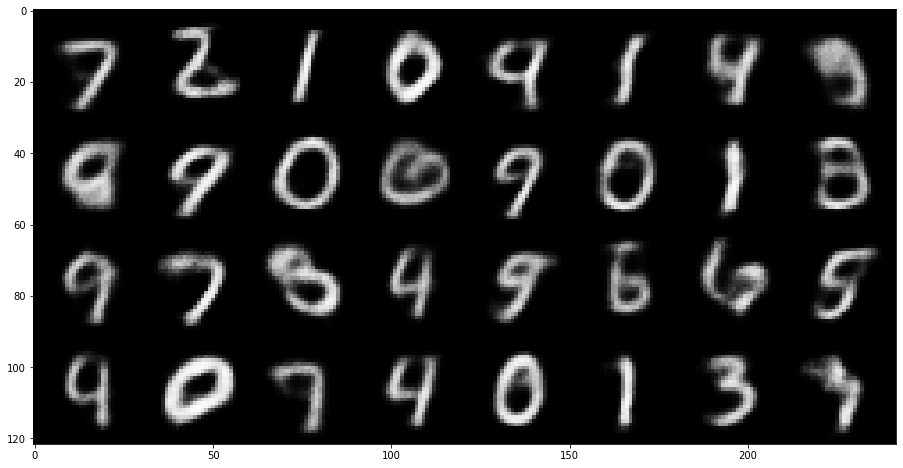

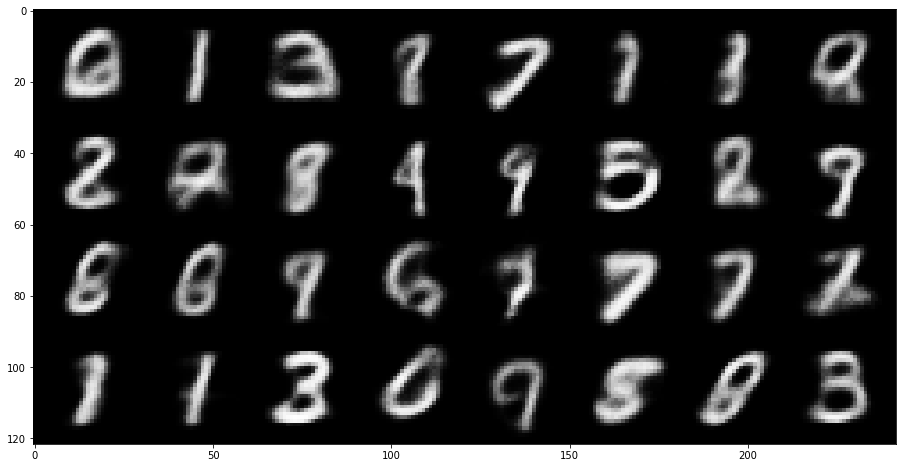

In [206]:
# *CODE FOR PART 1.2b IN THIS CELL*
print('Input images')
print('-'*50)

sample_inputs, _ = next(iter(loader_test))
sample_inputs_shape = sample_inputs.shape
fixed_input = sample_inputs[0:32, :, :, :]
fixed_input_shape = fixed_input.shape
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
fixed_input = fixed_input.to(device)
with torch.no_grad():

    # visualize the reconstructed images of the last batch of test set
    fixed_input = fixed_input.to(device)
    # fixed_input = fixed_input.view(fixed_input.size(0), -1)
    recon_batch, _, _ = model(fixed_input)
    print(recon_batch.shape)
    recon_batch = recon_batch.reshape(shape=fixed_input_shape)

    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 32
z = torch.randn(n_samples, latent_dim).to(device)
with torch.no_grad():

    sample_inputs = z.to(device)
    print(f'sample inp {sample_inputs.shape}')
    # sample_inputs = sample_inputs.view(sample_inputs.size(0), -1)
    samples = model.decode(sample_inputs)
    samples = samples.reshape(shape=fixed_input_shape)

    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(samples)

### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**ANSWER**

There are a few key components to pick out from the curves and reconstructions.Firstly for the graphs, the total loss is as we expect - the loss starts high and we see good convergence to an optimum point. We also see both the components of the loss (KL and RL) decrease with time. The reconstruction loss is the larger component of the total loss and so we see that the images are getting better after reconstruction. We can see from the reconstructued images that really they are acceptable, and easily made out to be the handwritten digits. The KL divergence ensures that the returned distribution in the latent space does not diverge too far from the assumed standard Gaussian. We see a trade off as we change the value for beta that a high beta gives more weight to the RL - this is the trade off we have to assume when defining the loss function. As described before it is normally kept between 0 and 1 for a balance of good reconstruction and generation. The images displayed used a value fo beta=0.5, and we can see that the quality of the reconstructed images fed all the way through the network are far better than those generated from the latent space. This implies that our balance is probably a bit off and too weighted in favour of the RL, therefore a lower value of beta would be better.

It should be pointed out that I first implemented my network using only linear layers, and in this case I saw an increase in KL and a larger decrease in RL which can also be explained as converging to an optimum. However in both cases we see a trade off between RL and KL according the beta value that is set.

Posterior collapse occurs when the signal from input x to posterior parameters is either too noisy or too weak: 

*   Too weak and the posterior q(z|x) is approximately equal to the prior q(z). This means that the distribution of the posterior is disconnected from x. The mean and std of the posterior collapse to constant values and the decoder tries to reconstruct x by ignoring useless z's which are sampled with these collapsed constant mean and std values. 
*   Too noisy means mean and std are unstable and therefore the sampled z values are also unstable, thus the output of the the decoder becomes almost independent of z. This will result in poor representations of the input x. 

We can see for the large beta values in the loss curves that we see some of this effect, low weight is given to the KL divergence so the model focuses only on reconstructing images with minimal loss. We can see this is has overall the highest total loss and so we do not optimise so well. 

---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [207]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE
import pandas as pd
import seaborn as sns

test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)

beta = 0.5
path = 'CW_VAE/VAE_model_beta_'+str(beta)+'.pt'
model = torch.jit.load(content_path/path)
model.eval()

for i, (data, labels) in enumerate(test_dataloader):
    data = data.to(device)
    mu, log_var = model.encode(data)
    z = model.reparametrize(mu, log_var)
    labels = labels

z = z.cpu().detach().numpy()
z_embedded = tsne.fit_transform(z)

plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.004s...
[t-SNE] Computed neighbors for 10000 samples in 3.527s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.115934
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.585526
[t-SNE] KL divergence after 300 iterations: 2.779857


alt.HConcatChart(...)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.000s...
[t-SNE] Computed neighbors for 10000 samples in 2.313s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.376003
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.393715
[t-SNE] KL divergence after 300 iterations: 2.707437


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 2.024s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.115032
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.497536
[t-SNE] KL divergence after 300 iterations: 2.790391


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.989s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.127530
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.087059
[t-SNE] KL divergence after 300 iterations: 2.863845


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 2.018s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.168962
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.685799
[t-SNE] KL divergence after 300 iterations: 2.958199


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.001s...
[t-SNE] Computed neighbors for 10000 samples in 1.978s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.172993
[t-SNE] KL divergence after 50 iterations with early exaggeration: 93.157921
[t-SNE] KL divergence after 300 iterations: 3.477939


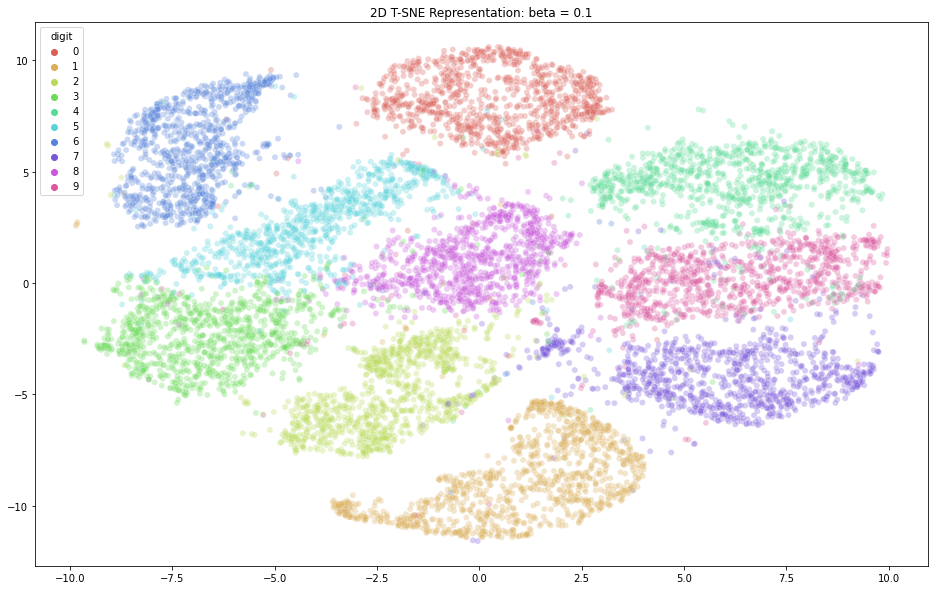

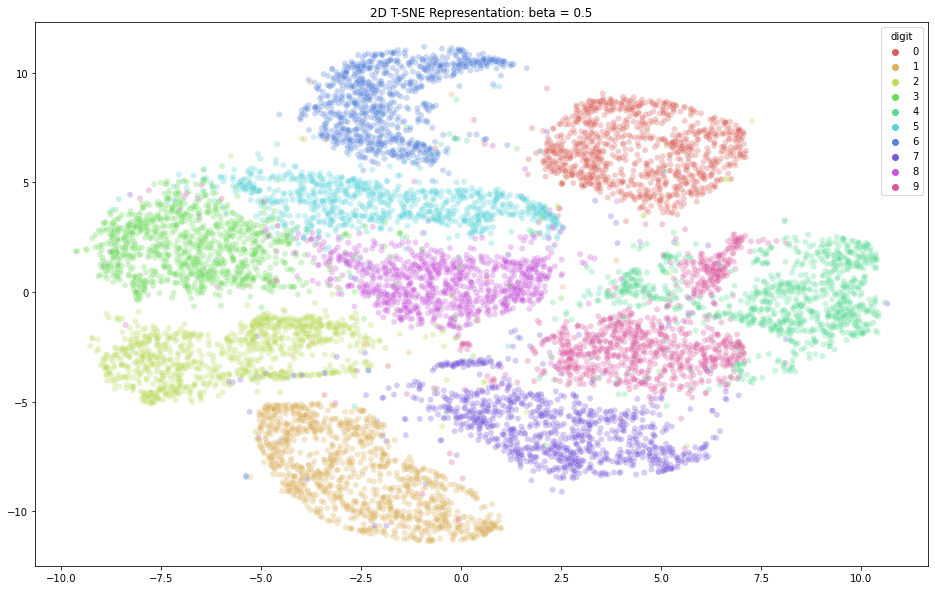

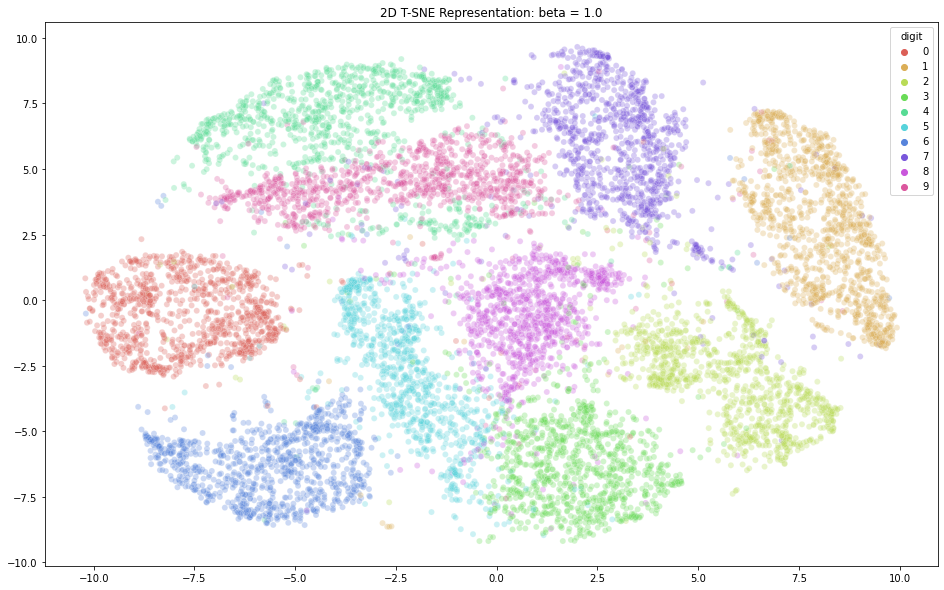

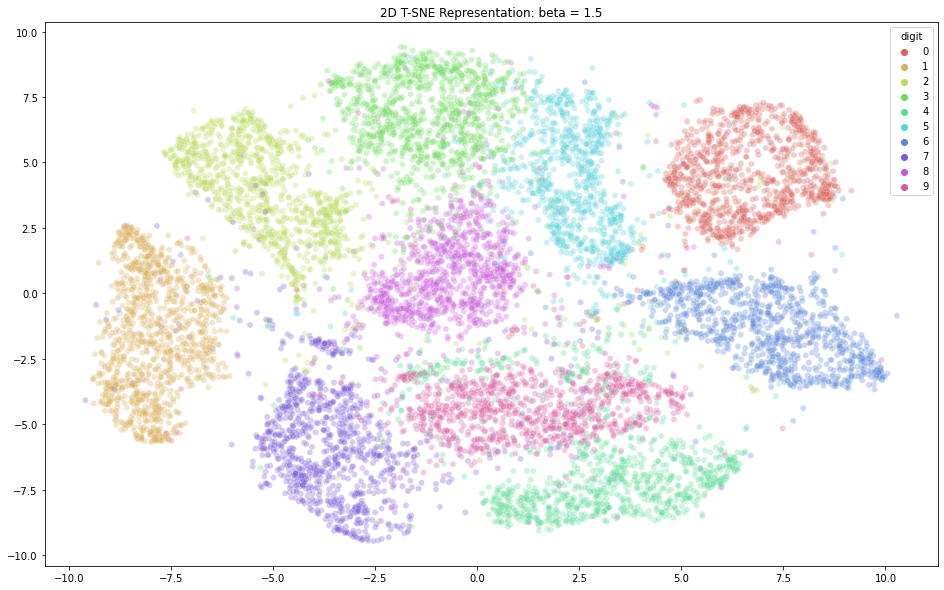

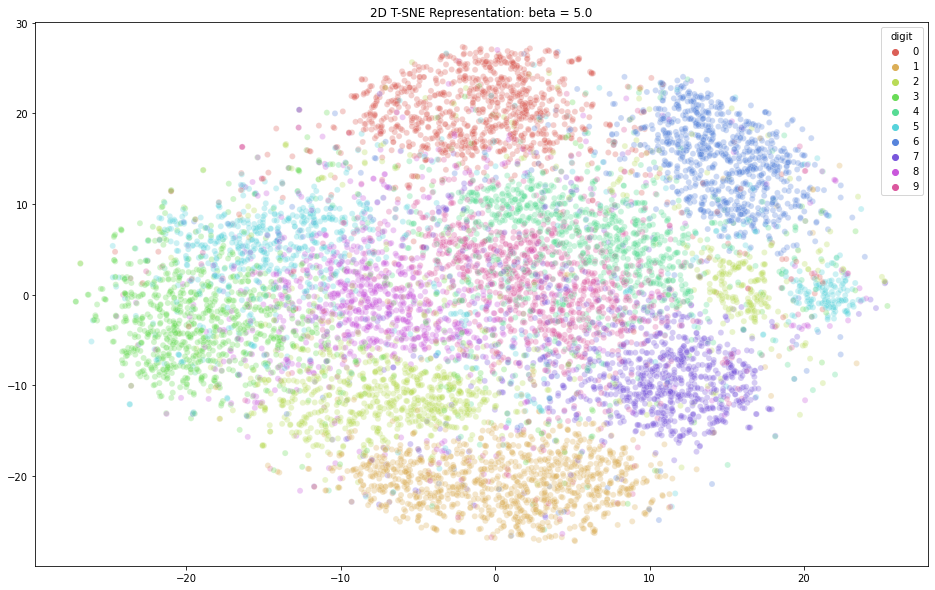

In [208]:
# CUSTOM VISUALIZATIONS
def scatter_tsne(z, z_embedded, labels, beta):
    title = '2D T-SNE Representation: beta = ' + str(beta)

    df = pd.DataFrame(z)
    df['digit'] = labels.numpy()
    plt.figure(figsize=(16,10))
    sns.scatterplot(
    x=z_embedded[:,0], y=z_embedded[:,1],
    hue='digit',
    palette=sns.color_palette("hls", 10),
    data=df,
    legend="full",
    alpha=0.3
    ).set(title=title)


test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)

for b, beta in enumerate(betas):
    for i, (data, labels) in enumerate(test_dataloader):
        
        data = data.to(device)
        path = 'CW_VAE/VAE_model_beta_'+str(beta)+'.pt'
        model = torch.jit.load(content_path/path)
        model.eval()

        mu, log_var = model.encode(data)
        z = model.reparametrize(mu, log_var)
        labels = labels

    z = z.cpu().detach().numpy()
    z_embedded = tsne.fit_transform(z)

    scatter_tsne(z, z_embedded, labels, beta)

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**ANSWER**

We can see clearly that as we increase the value of beta the clusters overlap more and more. This is due to the fact that we place more importance on the KL regularisation term which ensures that the posterior distribution doesnt diverge too far from the prior in the latent space. With low beta values the model can effectively ignore the regularisation term and act to minimise its RL, behaving almost like a classic autoencoder. However this means that the distributions in the latent space can be far apart (or have very small variances). However this means that the continuity of the distributions is compromised. As we move towards a higher beta value we see the bounderies begin to overlap with more an more outliers from each digits distribution falling within another distribution.

For beta < 1 these overlaps and outliers can be cosnidered acceptable, and the regularisation enforces the distributions to be close to the assumed Gaussian prior. As we get closer to one we put more importance on the covariance matrices being close to the identity and mean to be close to 0, preventing the encoded distributions from being too far apart from each other. 

When we go larger than one we put too much emphasis on the divergence term and get a disentangled representation, which can have a different use as mentioned previously. With a factorized prior p(z) and beta > 1 the VAE can be trained to get a disentangled representation. This would mean controlled generation could be achieved by varying different dimensions of the z variable. 

There is the danger that T-SNE's can show what we want them to show, and in effect varying the parameter for perplexity can give us very different representations in a 2D space. The graphs are not a rigorous form of science to study the latent space distributions, however as summarised above it can allow some intuition behind what is going on the latent space.


## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?


digits: tensor([0, 6])


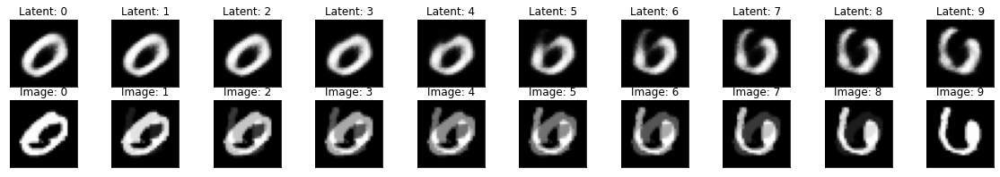

In [ ]:
# CODE FOR PART 1.3b IN THIS CELL
def interpolate(v1, v2, n=10):
    '''
    interpolates between two vectors in latent space
    '''
    ratios = np.linspace(0, 1, n)
    int_vecs = list()
    for ratio in ratios:
        v = (1.0 - ratio) * v1 + ratio * v2
        int_vecs.append(v)

    return int_vecs


int_loader = DataLoader(test_dat, 2, shuffle=True)

for i, (data, label) in enumerate(int_loader):

    dig1 = data[0].reshape(1, 1, 28, 28).to(device)
    dig2 = data[1].reshape(1, 1, 28, 28).to(device)
    print(f"digits: {label}")

    if i == 0:
        break

mu, logvar = model.encode(dig1)
enc_dig1 = model.reparametrize(mu, logvar)

mu, logvar = model.encode(dig2)
enc_dig2 = model.reparametrize(mu, logvar)

original_image_vectors = interpolate(dig1.flatten(),dig2.flatten())
generated_image_vectors = interpolate(enc_dig1.flatten(), enc_dig2.flatten())

n = 10
plt.rcParams["figure.figsize"] = (20,8)

for i, enc_img in enumerate(generated_image_vectors):

    ax = plt.subplot(5, n, n + i + 1)

    enc_img = enc_img.reshape(1, -1)
    img = model.decode(enc_img).cpu().squeeze(0).detach().reshape(28, 28)
    plt.imshow(img.numpy())
    
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title("Latent: {}".format(i))


    ax = plt.subplot(5, n,2*n+ i + 1)
    
    plt.imshow(original_image_vectors[i].cpu().detach().numpy().reshape(28,28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    ax.set_title("Image: {}".format(i))
plt.show()

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**ANSWER**

We can see for both the interpolation of the the original image and the interpolation in the latent space that the numbers slowly morph from a 0 into a 6. However, interestingly we see that for the latent space inetrpolation the numbers morph far more smoothly into one an other giving us a more intuitive 'feel' for what half way between the two digits feels like, maybe implying that this is the way our brains think, rather than the change in appropriate pixel brightness seen in the bottom row.

This relates to the T-SNE plots if we were to choose a single point in the centre of one of the clusters relating to a 6 and 'walk' slowly to the centre of the 0's. We are able to do this because of our regularisation KL term which ensures that the the model does not encode data too far apart in the latent space, encouraging the different distributions to overlap and enable this interpolation. This way we require the covariance matrices to be close to the identity preventing punctual distributions, also the mean needs to be close to 0 preventing encodings too far apart from one another. We can see for teh various values of beta in the T-SNE plots that this overlapping effect is more pronounced with high beta, and so the tradeoff with RL can be clearly seen. we ideally want something with some overlapping so we can intuitively interpolate.

This interpolation effect could for example be used between a man and a womans latent space representation or a cat and a dog. 

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
import torch.nn.functional as F
import matplotlib.pyplot as plt

mean = torch.Tensor([0.5, 0.5, 0.5])
std = torch.Tensor([0.5, 0.5, 0.5])

unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [ ]:
batch_size = 128
image_size = 64

transform = transforms.Compose([
     transforms.Resize(image_size),
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std),                        
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data/
Files already downloaded and verified


We'll visualize a subset of the test set: 

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


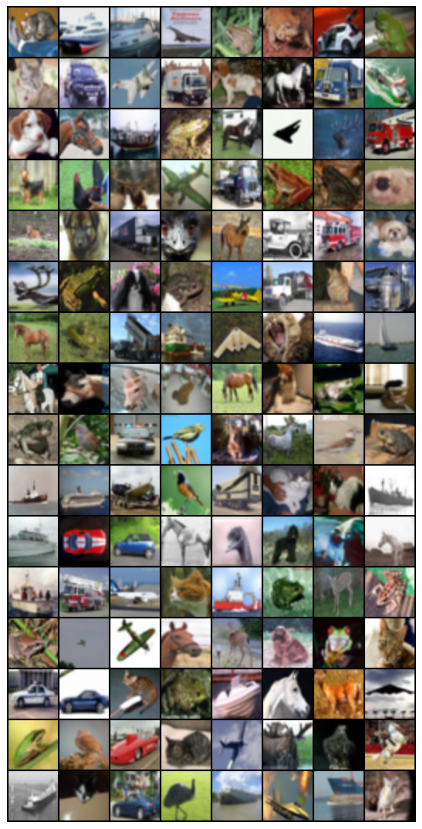

In [ ]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*
# HYPERPARAMETERS

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 128

# Size of feature maps in discriminator
ndf = 128

# Number of training epochs
num_epochs = 40

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

In [ ]:
# *CODE FOR PART 2.1 IN THIS CELL*
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.Dropout(0.2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.Dropout(0.2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.Dropout(0.2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.Dropout(0.2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    # You can modify the arguments of this function if needed
    def forward(self, z):
        return self.main(z)


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.Dropout(p=0.5, inplace=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.Dropout(p=0.5, inplace=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.Dropout(p=0.5, inplace=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.Dropout(p=0.5, inplace=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )


        self.main2 = nn.Sequential(
            nn.Linear(ndf*8 * 4 * 4, 1), 
            nn.Sigmoid()
        )

    def forward(self, x, matching=False):

        output = self.main(x)
        feature = output.view(-1, ndf*8 * 4 * 4) 
        output = self.main2(feature).view(-1, 1, 1, 1)

        if matching == True:
            return feature, output
        else:
            return output

<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 12658432
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): Dropout(p=0.2, inplace=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Dropout(p=0.2, inplace=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Dropout(p=0.2, inplace=False)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [ ]:
# You can modify the arguments of this function if needed
def loss_function(out, label, model_type):
    if model_type == "D":
        criterion = nn.BCELoss()
        loss = criterion(out, label)
    else:
        criterion = nn.MSELoss()
        loss = criterion(out, label)
    return loss

<h3>Choose and initialize optimizers</h3>

In [ ]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
criterion = nn.BCELoss()
optimizerD = torch.optim.Adam(model_D.parameters(), lr=lr,betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=lr, betas=(beta1, 0.999))

<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [ ]:
fixed_noise = torch.randn(batch_size, nz, 1, 1, device=device)

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

In [ ]:
import torchvision.utils as vutils
import random

# TRAINING LOOP

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

# real_label = 0.9
fake_label = 0.

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(loader_train, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ############################
        ## Train with all-real batch
        model_D.zero_grad()

        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)

        real_label = random.uniform(0.9, 1.0)

        noise_prop =0.02
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        flipped_idx = torch.from_numpy(np.random.choice(np.arange(len(label)), size=int(noise_prop*len(label))))
        label[flipped_idx] = 1 - label[flipped_idx]

        # Forward pass real batch through D, calculate losses and gradients
        output = model_D(real_cpu).view(-1)
        errD_real = loss_function(output, label, "D")
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors and fake image batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = model_G(noise)

        label.fill_(fake_label)
        # Classify all fake batch with D, calculate loss and gradients
        output = model_D(fake.detach()).view(-1)
        errD_fake = loss_function(output, label, "D")
        errD_fake.backward()
        D_G_z1 = output.mean().item()

        # Compute error of D as sum over the fake and the real batches, update D
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        model_G.zero_grad()

        real_label = 0.

        label.fill_(real_label)

        # Feature Matching
        feature_fake, _ = model_D(fake, matching=True)
        feature_real, _ = model_D(real_cpu.detach(), matching=True)

        feature_fake = torch.mean(feature_fake, 0)
        feature_real = torch.mean(feature_real, 0)

        errG = loss_function(feature_fake, feature_real, "G")

        # Calculate gradients for G, update G
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(loader_train),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(loader_train)-1)):
            with torch.no_grad():
                fake = model_G(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    if epoch == 0:
        save_image(denorm(real_cpu.cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        save_image(denorm(fake).float(), str(content_path/'CW_GAN/fake_samples_epoch_%03d.png') % epoch)

# save  models 
torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Starting Training Loop...
[0/40][0/391]	Loss_D: 1.4618	Loss_G: 0.0076	D(x): 0.5418	D(G(z)): 0.5463 / 0.5463
[0/40][50/391]	Loss_D: 0.4153	Loss_G: 0.0254	D(x): 0.9128	D(G(z)): 0.0655 / 0.0655
[0/40][100/391]	Loss_D: 0.8899	Loss_G: 0.0119	D(x): 0.7947	D(G(z)): 0.3984 / 0.3984
[0/40][150/391]	Loss_D: 1.0354	Loss_G: 0.0081	D(x): 0.6675	D(G(z)): 0.3624 / 0.3624
[0/40][200/391]	Loss_D: 0.7423	Loss_G: 0.0086	D(x): 0.6999	D(G(z)): 0.2187 / 0.2187
[0/40][250/391]	Loss_D: 0.7625	Loss_G: 0.0100	D(x): 0.8162	D(G(z)): 0.3232 / 0.3232
[0/40][300/391]	Loss_D: 0.6621	Loss_G: 0.0108	D(x): 0.8629	D(G(z)): 0.2594 / 0.2594
[0/40][350/391]	Loss_D: 3.0982	Loss_G: 0.0072	D(x): 0.9745	D(G(z)): 0.9175 / 0.9175
[1/40][0/391]	Loss_D: 1.1079	Loss_G: 0.0094	D(x): 0.4100	D(G(z)): 0.0300 / 0.0300
[1/40][50/391]	Loss_D: 0.4964	Loss_G: 0.0096	D(x): 0.7838	D(G(z)): 0.1646 / 0.1646
[1/40][100/391]	Loss_D: 0.6790	Loss_G: 0.0080	D(x): 0.7926	D(G(z)): 0.2827 / 0.2827
[1/40][150/391]	Loss_D: 0.9680	Loss_G: 0.0071	D(x): 0.65

/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:991: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 1572686 / 1572864 (100.0%)
Greatest absolute difference: 1.0930856764316559 at index (86, 0, 37, 55) (up to 1e-05 allowed)
Greatest relative difference: 1377910.3953488371 at index (120, 2, 20, 41) (up to 1e-05 allowed)
  _module_class,
/usr/local/lib/python3.7/dist-packages/torch/jit/_trace.py:991: TracerWarning: Output nr 1. of the traced function does not match the corresponding output of the Python function. Detailed error:
Tensor-likes are not close!

Mismatched elements: 128 / 128 (100.0%)
Greatest absolute difference: 0.49129875795915723 at index (124, 0, 0, 0) (up to 1e-05 allowed)
Greatest relative difference: 89.03571585596289 at index (124, 0, 0, 0) (up to 1e-05 allowed)
  _module_class,


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

/usr/local/lib/python3.7/dist-packages/torchvision/utils.py:50: UserWarning: range will be deprecated, please use value_range instead.
  warnings.warn(warning)


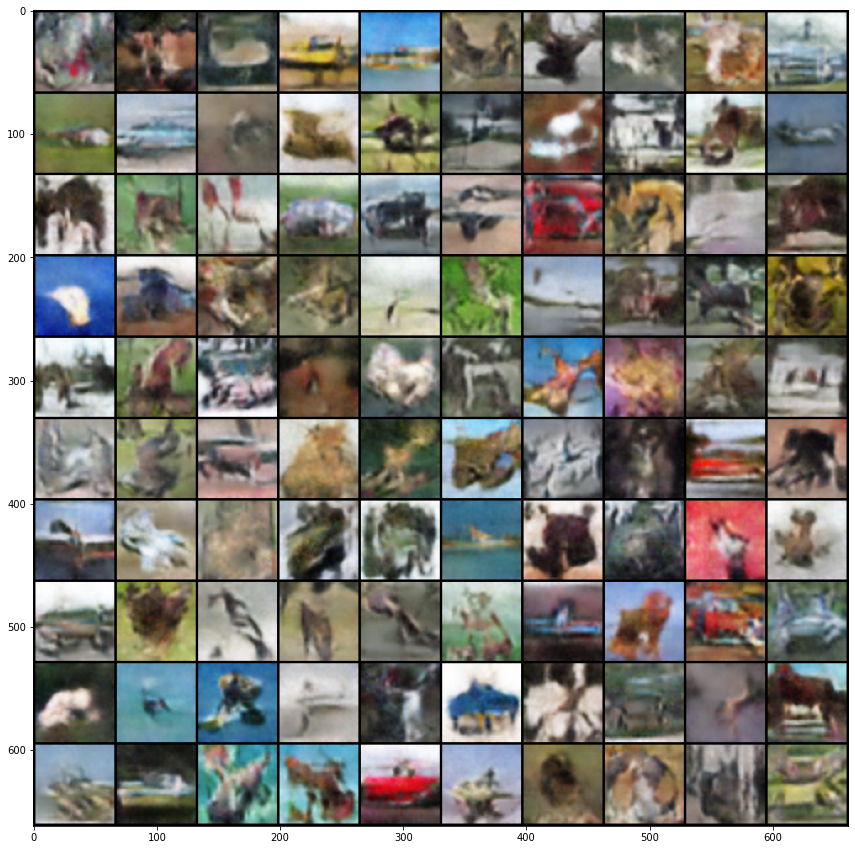

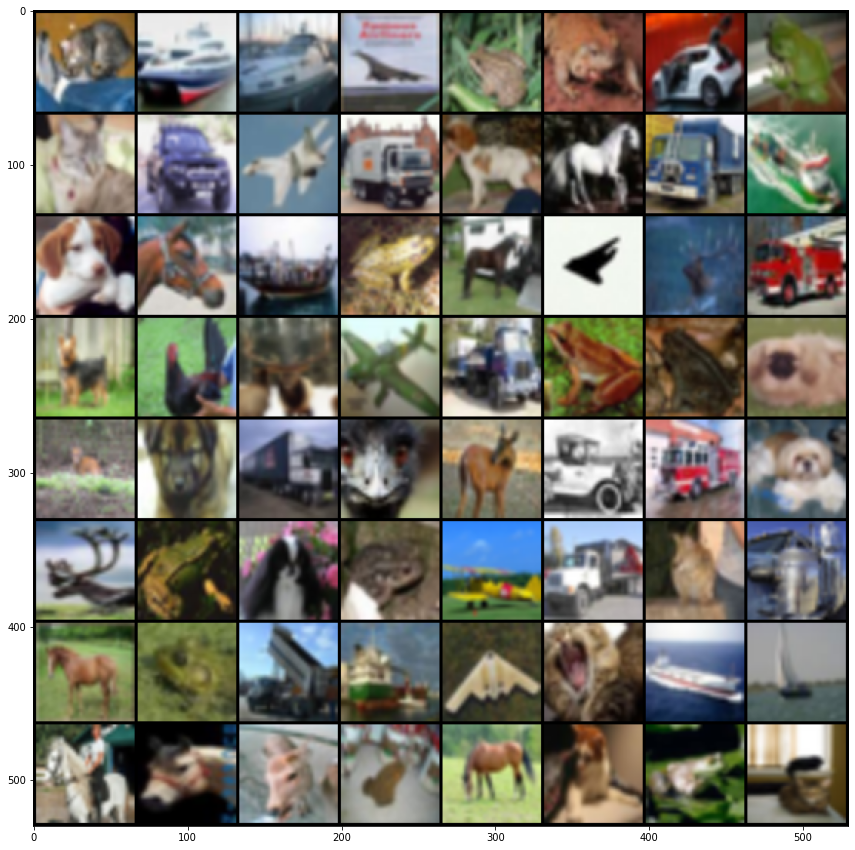

In [ ]:
input_noise = torch.randn(100, nz, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

 A large part of the literature implies that training GANs can be an art at times, and often very frustrating. I have certainly found that just implementing the architecture of the original GAN paper (Goodfellow et al, 2014) did not result in images that showed any definition whatsover other than some very broad features and colours seen in the real images. In practice it was a case of trying out a number of different empirically useful methods and seeing what worked on my dataset and with my general architecture. The main tweaks were as follows:


1.   Using a large number of filters - This increased performance significantly, using 128 filters to begin with (and increasing this during the deeper layers for the Generator). Particularly for the Generator network this resulted in a dramatic change in image quality as images became less blurry, the intuition is that more filters helped to capture additional information and increase the sharpness in generated images
2.   Using larger kernels - again this added to the sharpness of my images, in the Generator at the top convolutional layers this ensured more smoothness (using 5x5 kernels). For the discriminator i used 4x4 kernels as this ensured the loss didnt rapidly approach zero (which kills learning too early).
3.   Feature matching - I altered the loss function of the generator in order to avoid mode collapse. I was getting the effect that the same image would be generated too often (for example a deer), this was likely affected by the generator and discriminator getting stuck in a greedy loop. Therfore instead of using BCE loss I evaluated a new objective function to minimize the statistical difference between the features of the real and generated images, this changes the objective of the generator from just adversarially 'beating' the discriminator to matching features in real images. This required extracting a feature layer from the discriminator and slowed down my training time significantly, but produced good results. The discriminator did not overfit itself as some randomness was introduced. 
4.   Soft labels - I changed the labels to a random uniform number between 0.9 and 1.0 for the real labels. This was important again for the discriminator so it doesnt kill learning early on with hard labels, or undefit. Salimans et. al. (2016) describes using this process to effect.
5.   Noisy labels - I switched the labels of 5% of images fed to the discriminator, adding this noise also helped.
6.   Dropout on generator - I provided noise in the form of dropout with 50% of nodes dying, this noise also seemed to help with my images.
7.   Normalize the images between -1 and 1 - I set the mean and std to [0.5, 0.5, 0.5] in order that they are all between -1 and 1. As the images are run through a tanh layer at the end of the network we need to ensure teh outputs are also between 0 and 1, this was chosen in place of removing the tanh layer.

There were other changes tried, such as flipping teh labels for stabilisationa t the begging of the training, using SGD for the discriminator loss, data augmentation etc. But none had the desired effect and so the above were used. I suspect it is tailored to the exact dataset and training conditions (i.e. scope of this coursework) to decide what works and what doesnt. Most important was increasing the number of filters, soft labels and introducing feature matching. I am unsure whether all the applied methods and in what permutations really helped the network but it was fun to play around with and the image quality is sufficient. 

## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

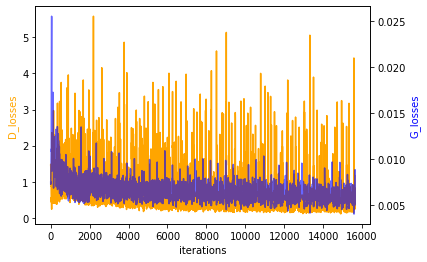

In [ ]:
# ANSWER FOR PART 2.2 IN THIS CELL*
X = np.arange(len(G_losses))

fig,ax = plt.subplots()
ax.plot(X, D_losses, color="orange", label="D_losses")
ax.set_xlabel("iterations")
ax.set_ylabel("D_losses", color="orange")

ax2=ax.twinx()
ax2.plot(X, G_losses, color="blue", alpha=0.6, label="G_losses")
ax2.set_ylabel("G_losses", color="blue")


plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The curves look sensible on the whole, although the curves are difficult to truly compare as the scales of the loss function are so different. This is due to the fact that the loss function for the generator was changed to allow for feature mapping as a fairly new technique of avoiding mode collapse.

For the discriminator network we see an overall trend downwards but never converging to zero. This is in fact what we wanted to see as described in the  section above there were numerous methods emplyed to allow some noise into the model to avoid the discriminator wuickly descending to zero (and prevent any more learning). 

For the generator we see some initial noise and then a quick convergence, with an overall trend down. The number of epochs was very important for the quality of my images and the longer the better it seemed, but due to teh size of the model and time constraints this was left at 40. 

For both curves we expect to see the noise we do as it is by nature an adversarial network trying to beat itself and so there is always a tradeoff when one does well the other should trip up.


## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

### Discussion


**ANSWER**

As mentioned in the description of my engineering decisions I did see this exact behaviour as I experienced the 'cat and mouse' scenario whereby my generator kept producing a good image of a deer. I was experiencing partial collapse rather than a full collapse situation where every generated image was the same, but it was still not useful for what I intended for my GAN.  
This was due to the effect that the generator is not directly incentivized to cover all modes, producing poor diversity among generated samples. 

This can be explained by the generator having the objective of creating images to fool the discriminator the most. Imagine the extreme scenario when the discriminator does not update itself at all - this would cause the generated images to converge to find the optimal image, and collapse to a single point that is the most realistic according to the discriminators perspective. If we now begin to train the discriminator, as one term of the terms of the discriminators loss is to detect generated images, it will likely push this point around and both networks become overfitted to exploit short term weaknesses in the opponent.

My solution as described above was to introduce 'feature matching'. This extended the cost function of the generator to matching features in real images rather than just trying to beat the discriminator. the objective function used can be seen in the cell below. This significantly improved my training process, producing randomness and avoiding overfiiting in the discriminator.

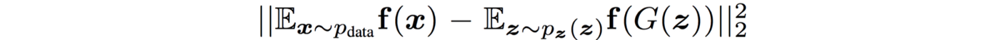



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [ ]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "../data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [ ]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [ ]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):  
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 100

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [ ]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [ ]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

In [ ]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

In [ ]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)